<p style="font-family: Arial; font-size:3.75em;color:purple; font-style:bold"><br>
Satellite Image Data <br><br><br>Analysis using numpy</p>

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>Data Source: Satellite Image from WIFIRE Project</p>


WIFIRE is an integrated system for wildfire analysis, with specific regard to changing urban dynamics and climate. The system integrates networked observations such as heterogeneous satellite data and real-time remote sensor data, with computational techniques in signal processing, visualization, modeling, and data assimilation to provide a scalable method to monitor such phenomena as weather patterns that can help predict a wildfire's rate of spread. You can read more about WIFIRE at: https://wifire.ucsd.edu/

In this example, we will analyze a sample satellite image dataset from WIFIRE using the numpy Library.


<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">Loading the libraries we need: numpy, scipy, matplotlib</p>

In [1]:
%matplotlib inline
import numpy as np
from scipy import misc
import matplotlib.pyplot as plt

值得一说的是scipy, **SciPy** (/ˈsaɪpaɪ'/) is an open source Python library **used for scientific computing and technical computing.**
<br/>

SciPy contains modules for optimization, linear algebra, integration, interpolation, special functions, FFT, signal and image processing, ODE solvers and other tasks common in science and engineering.

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
Creating a numpy array from an image file:</p> 

<br>
Lets choose a WIFIRE satellite image file as an ndarray and display its type.

<br/>还要说一下skimage

scikit-image (a.k.a. skimage) is **a collection of algorithms for image processing and computer vision.**

In [2]:
from skimage import data

photo_data = misc.imread('./wifire/sd-3layers.jpg')

type(photo_data)

numpy.ndarray

我的猜测是，只有通过scipy下面的misc的image read，才可以将这个image读取成一个3D的ndarray

Let's see what is in this image. 

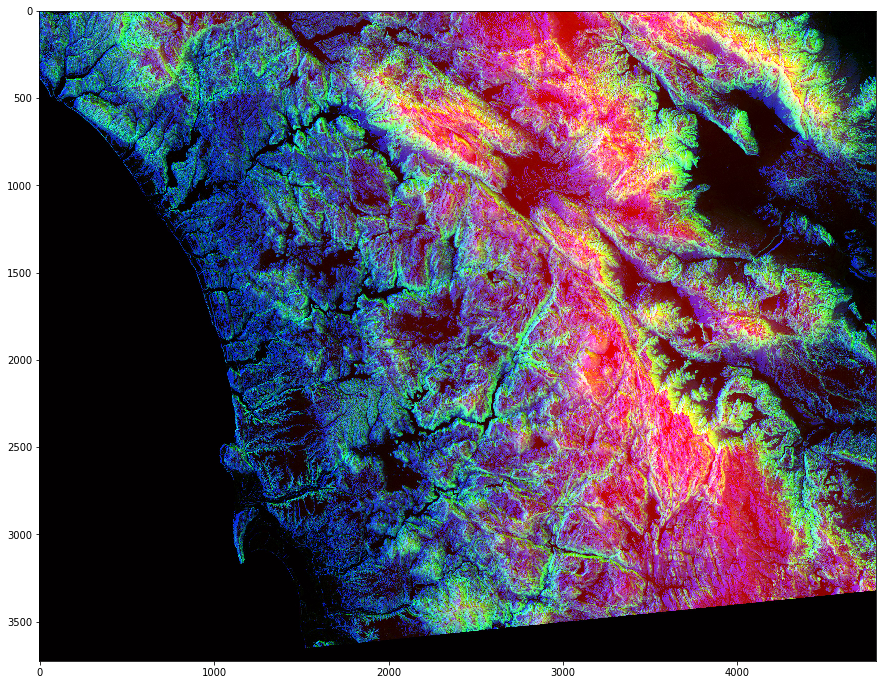

In [4]:
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

In [4]:
photo_data.shape

#print(photo_data)

(3725, 4797, 3)

从这个shape可以看出，有3725row,有4797col，然后这样的东西有3层，刚好是RGB

The shape of the ndarray show that it is a three layered matrix. The first two numbers here are length and width, and the third number (i.e. 3) is for three layers: Red, Green and Blue.

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
RGB Color Mapping in the Photo:</p> <br>
<ul>
<li><p style="font-family: Arial; font-size:1.75em;color:red; font-style:bold">
RED pixel indicates Altitude</p>
<li><p style="font-family: Arial; font-size:1.75em;color:blue; font-style:bold">
BLUE pixel indicates Aspect
</p>
<li><p style="font-family: Arial; font-size:1.75em;color:green; font-style:bold">
GREEN pixel indicates Slope
</p>
</ul>
<br>
The higher values denote higher altitude, aspect and slope.


In [5]:
photo_data.size

53606475

In [6]:
photo_data.min(), photo_data.max()

(0, 255)

可以看到，这个ndarray的值分布在0~255

In [7]:
photo_data.mean()

75.829935450894695

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>

Pixel on the 150th Row and 250th Column</p>

这是三层的，R,G,B三层的第150行，第250列的值是多少，也就是整幅画面中150，250这个格子的RGB是多少

In [8]:
photo_data[150, 250]

array([ 17,  35, 255], dtype=uint8)

下面这个是一层的，index1层，也就是第二层，即G层

In [9]:
photo_data[150, 250, 1]

35

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Set a Pixel to All Zeros</p>
<br/>
We can set all three layer in a pixel as once by assigning zero globally to that (row,column) pairing. However, setting one pixel to zero is not noticeable.

我们可以单独设置一个pixel的颜色，但是这图太大了，1个pixel不济于事啊

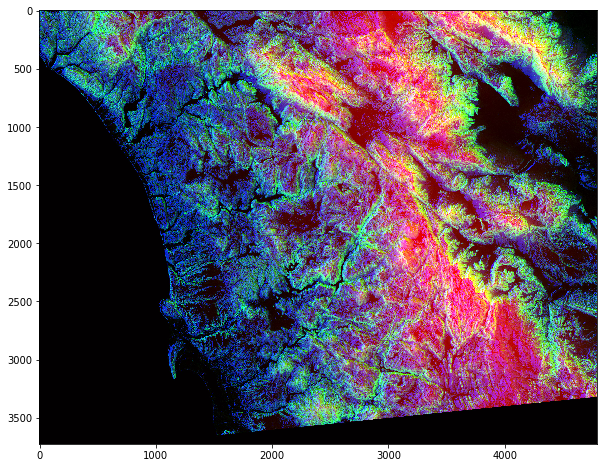

In [10]:
#photo_data = misc.imread('./wifire/sd-3layers.jpg')
photo_data[150, 250] = 0
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

现在我尝试一下给自己一个小练习，看能不能弄个小方块是白色的，就在150，250附近

[100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117
 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135
 136 137 138 139 140 141 142 143 144 145 146 147 148 149 150 151 152 153
 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171
 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189
 190 191 192 193 194 195 196 197 198 199]
[200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216 217
 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234 235
 236 237 238 239 240 241 242 243 244 245 246 247 248 249 250 251 252 253
 254 255 256 257 258 259 260 261 262 263 264 265 266 267 268 269 270 271
 272 273 274 275 276 277 278 279 280 281 282 283 284 285 286 287 288 289
 290 291 292 293 294 295 296 297 298 299]


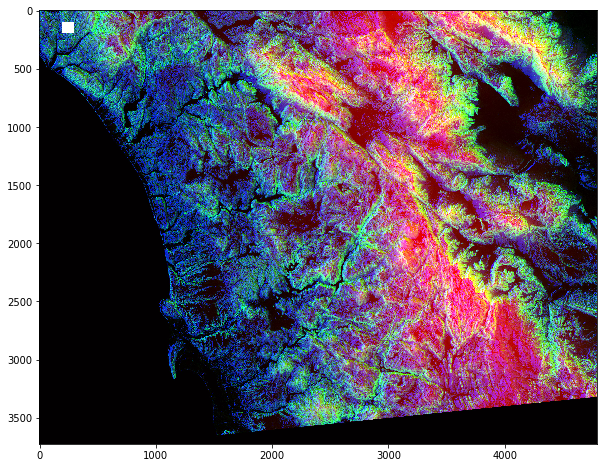

In [13]:
heng = np.arange(100,200)
shu = np.arange(200,300)
print(heng)
print(shu)
for a in heng:
    for b in shu:
        photo_data[a, b] = 255
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Changing colors in a Range<p/>
<br/>
We can also use a range to change the pixel values. As an example, let's set the green layer for rows 200 t0 800 to full intensity.

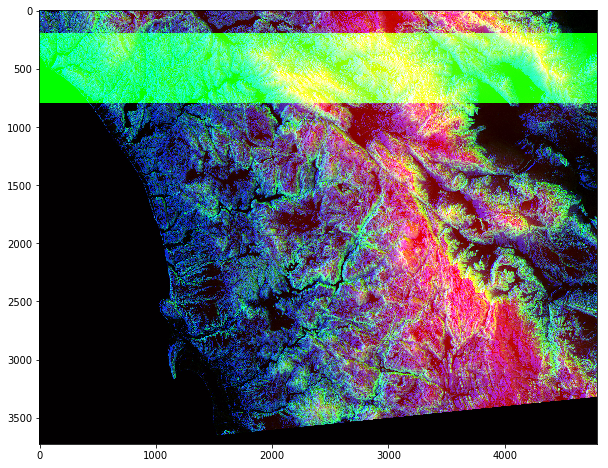

In [14]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')   #重新load图

photo_data[200:800, : ,1] = 255   #看看人家的方法，这就是ndarray的优势之处，用:就直接选出了这么多，第一个parameter是row,col次之，最后是layer
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

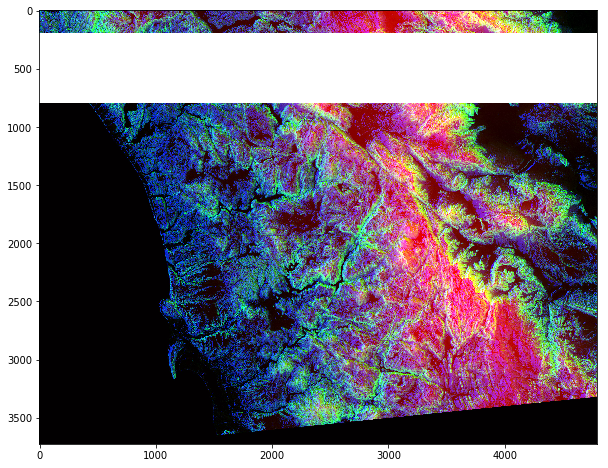

In [15]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')

photo_data[200:800, :] = 255    #这次不选layer了，所有都255，那就是白
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

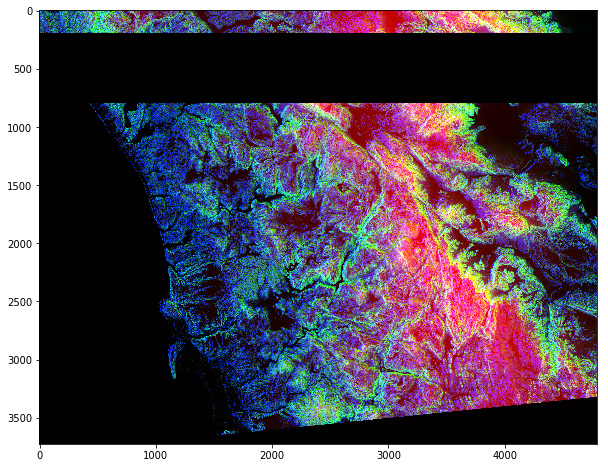

In [16]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')

photo_data[200:800, :] = 0   #黑
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Pick all Pixels with Low Values</p>

把所有低于200的数值弄成一个filter

In [17]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
print("Shape of photo_data:", photo_data.shape)
low_value_filter = photo_data < 200
print("Shape of low_value_filter:", low_value_filter.shape)

Shape of photo_data: (3725, 4797, 3)
Shape of low_value_filter: (3725, 4797, 3)


<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
Filtering Out Low Values</p><br/>
Whenever the low_value_filter is True, set value to 0.

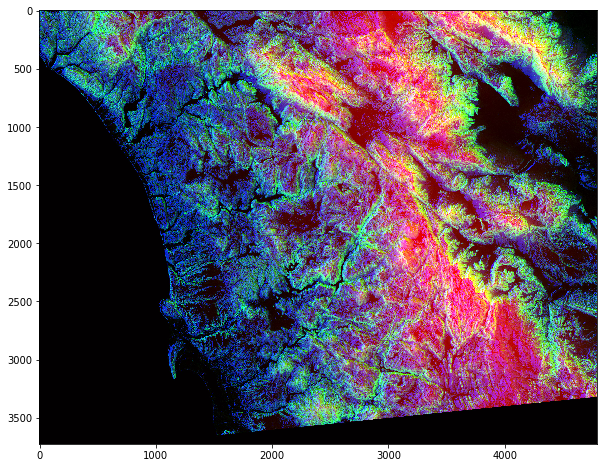

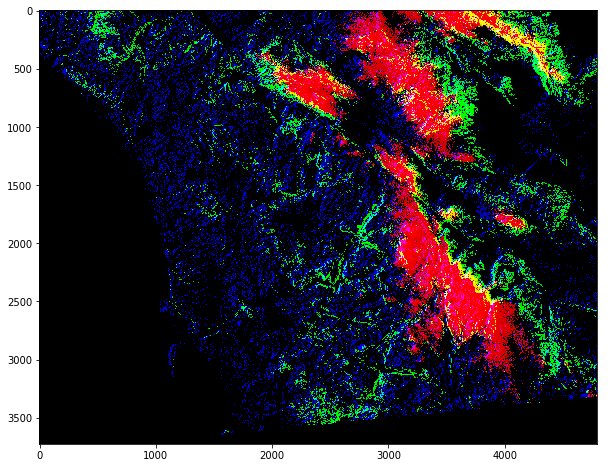

In [18]:
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

photo_data[low_value_filter] = 0   #把filter是true的东西，变成0，黑色

plt.figure(figsize=(10,10))
plt.imshow(photo_data)    #展示处理过的ndarray

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
More Row and Column Operations</p><br>
You can design complex patters by making cols a function of rows or vice-versa. Here we try a linear relationship between rows and columns.

In [19]:
rows_range = np.arange(len(photo_data))
cols_range = rows_range
print(type(rows_range))

<class 'numpy.ndarray'>


In [20]:
photo_data[rows_range, cols_range] = 255   #值得注意的是，这个和我上面那个nested for loop不同，它不会交叉对应，只会一一对应。看到，你是不是已经
#预料到结果了？结果不会是一个square，而是line或者称为dots

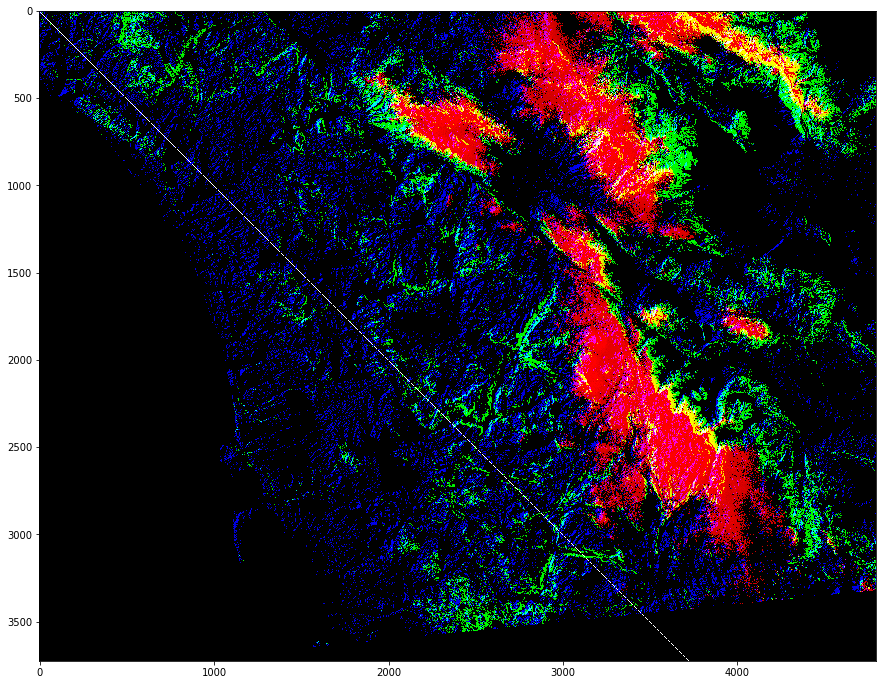

In [21]:
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

还有一个需要留意的

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Masking Images</p>
<br>Now let us try something even cooler...a mask that is in shape of a circular disc.

<img src="./001.png" align="left" style="width:550px;height:360px;"/>

In [3]:
total_rows, total_cols, total_layers = photo_data.shape
print("photo_data = ", photo_data.shape)

X, Y = np.ogrid[:total_rows, :total_cols]
print("X = ", X.shape, " and Y = ", Y.shape)

photo_data =  (3725, 4797, 3)
X =  (3725, 1)  and Y =  (1, 4797)


In [4]:
center_row, center_col = total_rows / 2, total_cols / 2
print("center_row = ", center_row, "AND center_col = ", center_col)
print(X - center_row)
print(Y - center_col)
dist_from_center = (X - center_row)**2 + (Y - center_col)**2
print(dist_from_center)
radius = (total_rows / 2)**2
print("Radius = ", radius)
circular_mask = (dist_from_center > radius)
print(circular_mask)
print(circular_mask[1500:1700,2000:2200])

center_row =  1862.5 AND center_col =  2398.5
[[-1862.5]
 [-1861.5]
 [-1860.5]
 ..., 
 [ 1859.5]
 [ 1860.5]
 [ 1861.5]]
[[-2398.5 -2397.5 -2396.5 ...,  2395.5  2396.5  2397.5]]
[[ 9221708.5  9216912.5  9212118.5 ...,  9207326.5  9212118.5  9216912.5]
 [ 9217984.5  9213188.5  9208394.5 ...,  9203602.5  9208394.5  9213188.5]
 [ 9214262.5  9209466.5  9204672.5 ...,  9199880.5  9204672.5  9209466.5]
 ..., 
 [ 9210542.5  9205746.5  9200952.5 ...,  9196160.5  9200952.5  9205746.5]
 [ 9214262.5  9209466.5  9204672.5 ...,  9199880.5  9204672.5  9209466.5]
 [ 9217984.5  9213188.5  9208394.5 ...,  9203602.5  9208394.5  9213188.5]]
Radius =  3468906.25
[[ True  True  True ...,  True  True  True]
 [ True  True  True ...,  True  True  True]
 [ True  True  True ...,  True  True  True]
 ..., 
 [ True  True  True ...,  True  True  True]
 [ True  True  True ...,  True  True  True]
 [ True  True  True ...,  True  True  True]]
[[False False False ..., False False False]
 [False False False ..., False Fal

上面这段代码就是把它弄成一个圆形的mask，然后利用TRUE FALSE搞事情

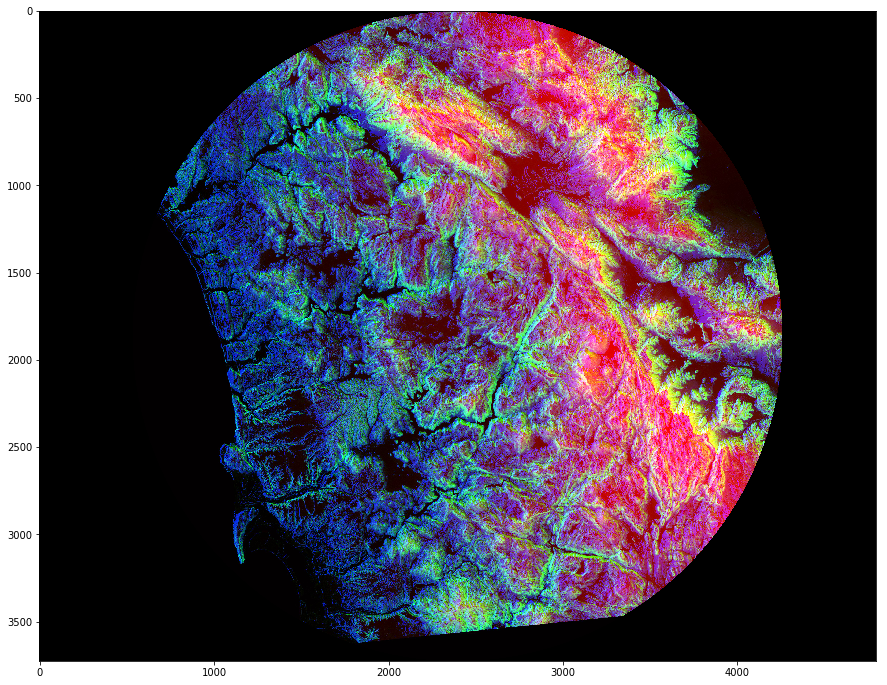

In [5]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
photo_data[circular_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
Further Masking</p>
<br/>You can further improve the mask, for example just get upper half disc.

<br/> 这个logical and非常有意思，可以限定两个filter之间的关系

In [6]:
X, Y = np.ogrid[:total_rows, :total_cols]
half_upper = X < center_row # this line generates a mask for all rows above the center

half_upper_mask = np.logical_and(half_upper, circular_mask)

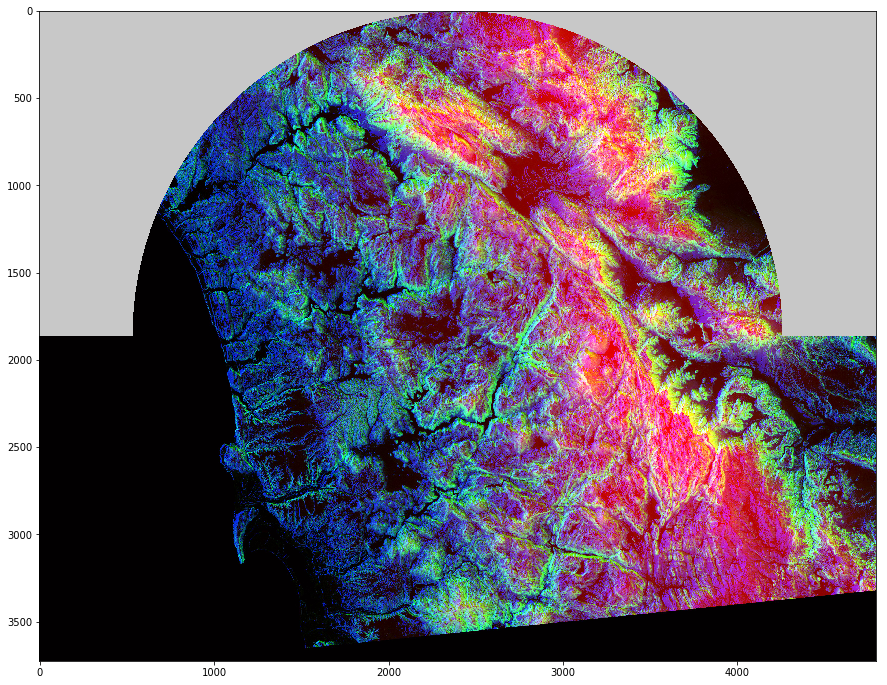

In [9]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
photo_data[half_upper_mask] = 255
#photo_data[half_upper_mask] = np.random.randint(200,255)
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:2.75em;color:purple; font-style:bold"><br>
Further Processing of our Satellite Imagery </p>

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
Processing of RED Pixels</p>

Remember that red pixels tell us about the height. Let us try to highlight all the high altitude areas. We will do this by detecting high intensity RED Pixels and muting down other areas.

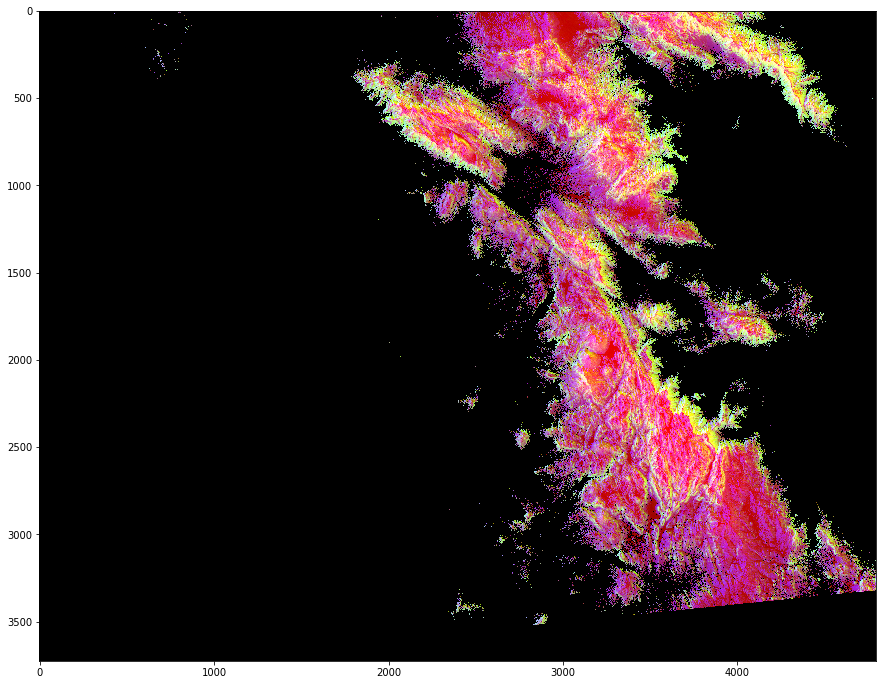

In [10]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
red_mask   = photo_data[:, : ,0] < 150

photo_data[red_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

这意思就是做一个filter，把red的150以下的intensity降到0

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Detecting Highl-GREEN Pixels</p>

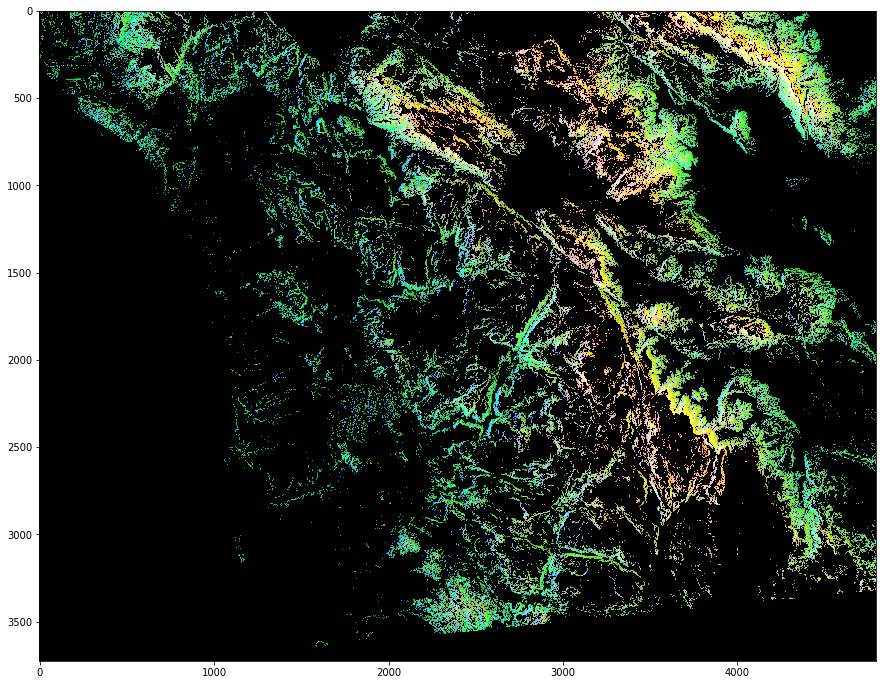

In [11]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
green_mask = photo_data[:, : ,1] < 150

photo_data[green_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Detecting Highly-BLUE Pixels</p>

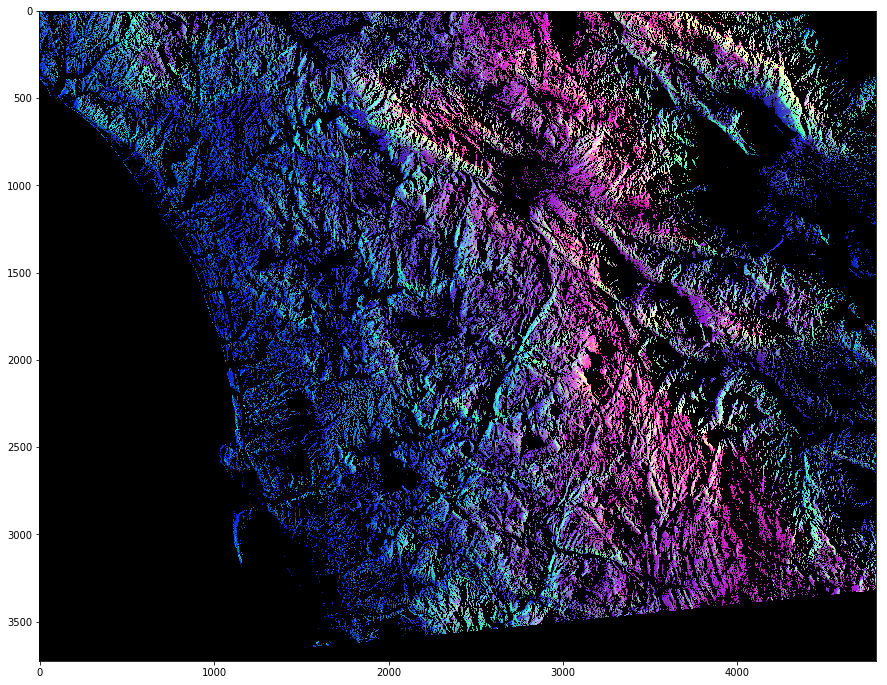

In [12]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')
blue_mask  = photo_data[:, : ,2] < 150

photo_data[blue_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>

Composite mask that takes thresholds on all three layers: RED, GREEN, BLUE</p>

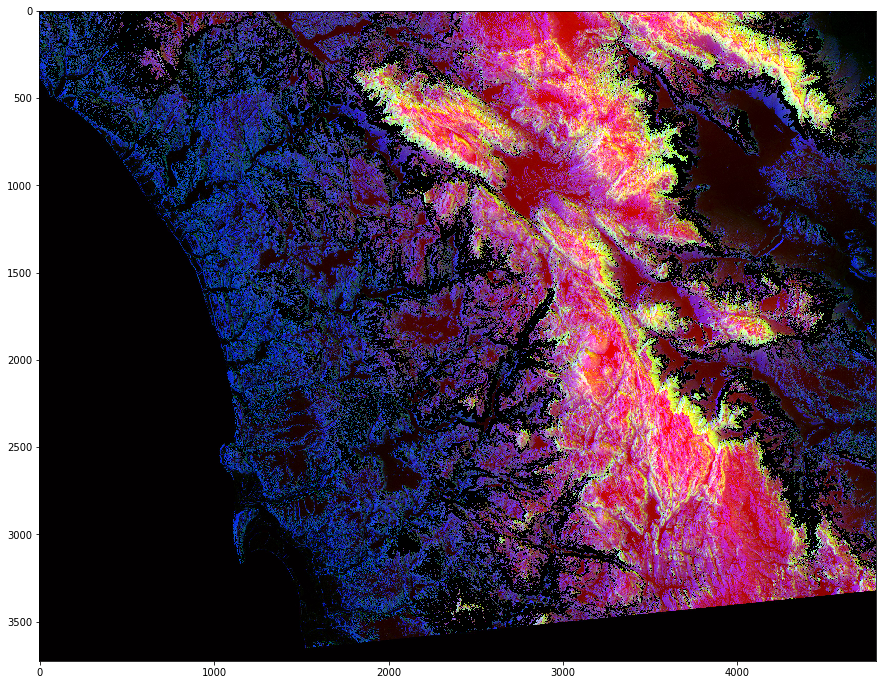

In [13]:
photo_data = misc.imread('./wifire/sd-3layers.jpg')

red_mask   = photo_data[:, : ,0] < 150
green_mask = photo_data[:, : ,1] > 100
blue_mask  = photo_data[:, : ,2] < 100

final_mask = np.logical_and(red_mask, green_mask, blue_mask)
photo_data[final_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)